In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/zomato-bangalore-restaurants/zomato.csv


# 1. Setup & Library Imports

In [2]:
import warnings 
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
import ast
import html

## 2. Data Overview & Initial Exploration

### 2.1 Load Dataset

In [3]:
df_original=pd.read_csv('/kaggle/input/zomato-bangalore-restaurants/zomato.csv')

In [4]:
df=df_original.copy()

In [5]:
df["item_id"] = df.index

In [6]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),item_id
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,0
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,1
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,2
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,3
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,4


### 2.2 Dataset Dimensions and Structure

In [7]:
df.shape

(51717, 18)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

### 2.3 Menu Item Column Exploration

In [9]:
df['menu_item'].head(50)

0                                                    []
1                                                    []
2                                                    []
3                                                    []
4                                                    []
5                                                    []
6                                                    []
7                                                    []
8                                                    []
9                                                    []
10                                                   []
11                                                   []
12                                                   []
13                                                   []
14                                                   []
15                                                   []
16                                                   []
17                                              

In [10]:
df['menu_item'].tail(50)

51667                                                   []
51668                                                   []
51669                                                   []
51670                                                   []
51671                                                   []
51672                                                   []
51673                                                   []
51674                                                   []
51675                                                   []
51676                                                   []
51677                                                   []
51678                                                   []
51679                                                   []
51680                                                   []
51681                                                   []
51682                                                   []
51683                                                   

### 2.4 Column Selection & Data Cleaning

**Decision:** Removing columns that are not essential for our analysis:
- `url`: Not needed for statistical analysis
- `address`: Location column provides sufficient geographical information
- `phone`: Contact information not relevant for pattern analysis
- `menu_item`:Empty, Too sparse and unstructured for meaningful analysis


In [11]:
df=df.drop(columns=["url" , "address" , "phone" , "menu_item"])
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,listed_in(type),listed_in(city),item_id
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,0
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,2
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,3
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,4


### 2.5 Duplicate Detection & Removal

In [12]:
df.duplicated().sum()

np.int64(0)

In [13]:
df=df.drop_duplicates()

In [14]:
df=df.reset_index(drop=True)

### 2.6 Missing Value Analysis

In [15]:
df.isnull().sum()

name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
listed_in(type)                    0
listed_in(city)                    0
item_id                            0
dtype: int64

In [16]:
df.isnull().mean()*100

name                            0.000000
online_order                    0.000000
book_table                      0.000000
rate                           15.033741
votes                           0.000000
location                        0.040606
rest_type                       0.438927
dish_liked                     54.291626
cuisines                        0.087012
approx_cost(for two people)     0.669026
reviews_list                    0.000000
listed_in(type)                 0.000000
listed_in(city)                 0.000000
item_id                         0.000000
dtype: float64

### 2.7 Column Renaming for Clarity

In [17]:
df.columns

Index(['name', 'online_order', 'book_table', 'rate', 'votes', 'location',
       'rest_type', 'dish_liked', 'cuisines', 'approx_cost(for two people)',
       'reviews_list', 'listed_in(type)', 'listed_in(city)', 'item_id'],
      dtype='object')

In [18]:
df=df.rename(columns={"approx_cost(for two people)":'cost2pepole','listed_in(type)':'type',"listed_in(city)":"city"})
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,reviews_list,type,city,item_id
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,0
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,1
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,2
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,3
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,4


### 3.1 Rating (`rate`) Column Processing

In [19]:
df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [20]:
#handel_rate
def handel_rate(r):
    try:
        return round(float(r[0:3]),1)
    except:
        return np.nan

In [21]:
df['rate']=df['rate'].apply(handel_rate)

In [22]:
df['rate'].unique()

array([4.1, 3.8, 3.7, 3.6, 4.6, 4. , 4.2, 3.9, 3.1, 3. , 3.2, 3.3, 2.8,
       4.4, 4.3, nan, 2.9, 3.5, 2.6, 3.4, 4.5, 2.5, 2.7, 4.7, 2.4, 2.2,
       2.3, 4.8, 4.9, 2.1, 2. , 1.8])

#### 3.1.1 Rating Statistics

In [23]:
df['rate'].describe()

count    41665.000000
mean         3.700449
std          0.440513
min          1.800000
25%          3.400000
50%          3.700000
75%          4.000000
max          4.900000
Name: rate, dtype: float64

### **Analysis Question:** What percentage of restaurants have missing ratings?

In [24]:
df['rate'].isna().mean()*100

np.float64(19.436548910416303)

In [25]:
df['rate_missing']=df['rate'].isna()

In [26]:
df['rate_missing'].value_counts()

rate_missing
False    41665
True     10052
Name: count, dtype: int64

#### 3.1.3 Visualization: Missing vs Available Ratings

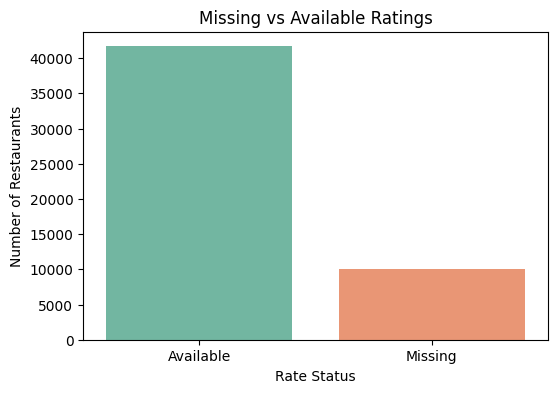

In [27]:
df['rate_missing_label']=df['rate_missing'].map({True:'Missing', False:'Available'})

plt.figure(figsize=(6,4))
sns.countplot(
    x='rate_missing_label',
    data=df,
    palette='Set2'
)

plt.title('Missing vs Available Ratings')
plt.xlabel('Rate Status')
plt.ylabel('Number of Restaurants')
plt.show()

#### 3.1.4 Rating Distribution

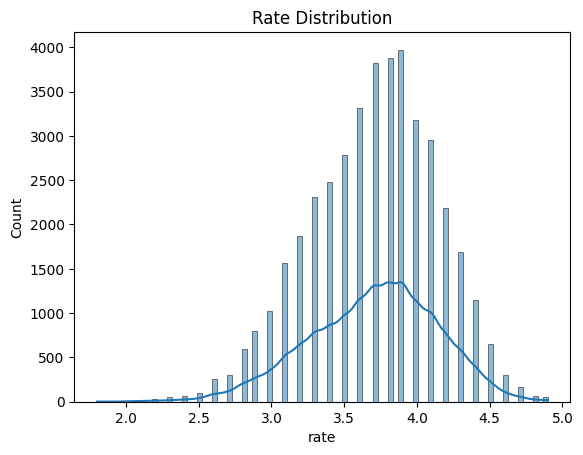

In [28]:
sns.histplot(df['rate'],kde=True)
plt.title("Rate Distribution")
plt.show()

### 3.2 Restaurant Name (`name`) Processing

 ### **Objective:** Standardize restaurant names and identify chain restaurants

In [29]:
df['name'].unique()

array(['Jalsa', 'Spice Elephant', 'San Churro Cafe', ..., 'Nawabs Empire',
       'SeeYa Restaurant',
       'Plunge - Sheraton Grand Bengaluru Whitefield Hotel &...'],
      dtype=object)

In [30]:
df['name']

0                                                    Jalsa
1                                           Spice Elephant
2                                          San Churro Cafe
3                                    Addhuri Udupi Bhojana
4                                            Grand Village
                               ...                        
51712    Best Brews - Four Points by Sheraton Bengaluru...
51713                             Vinod Bar And Restaurant
51714    Plunge - Sheraton Grand Bengaluru Whitefield H...
51715    Chime - Sheraton Grand Bengaluru Whitefield Ho...
51716                         The Nest - The Den Bengaluru
Name: name, Length: 51717, dtype: object

In [31]:
df['name']=df['name'].str.lower().str.strip()

In [32]:
df['name'].unique()

array(['jalsa', 'spice elephant', 'san churro cafe', ..., 'nawabs empire',
       'seeya restaurant',
       'plunge - sheraton grand bengaluru whitefield hotel &...'],
      dtype=object)

In [33]:
df['name'].value_counts()

name
cafe coffee day      96
onesta               85
just bake            74
empire restaurant    71
five star chicken    70
                     ..
mothi restaurant      1
nalaas aapakadai      1
jalsa adda            1
squeez juice bar      1
desi chats            1
Name: count, Length: 8743, dtype: int64

#### 3.2.1 Chain Restaurant Identification

#### **Feature Engineering:** Creating indicators for chain restaurants and their size

In [34]:
name_counts=df['name'].value_counts()
df['is_chain']=df['name'].map(lambda x:1 if name_counts[x]>1 else 0)
df['chain_size']=df['name'].map(name_counts)

In [35]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,reviews_list,type,city,item_id,rate_missing,rate_missing_label,is_chain,chain_size
0,jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,Banashankari,0,False,Available,1,11
1,spice elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,Banashankari,1,False,Available,1,4
2,san churro cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,Banashankari,2,False,Available,1,11
3,addhuri udupi bhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,Banashankari,3,False,Available,1,2
4,grand village,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,Banashankari,4,False,Available,1,4


### 3.3 Online Order Feature (`online_order`)

#### **Analysis Question:** What is the distribution of restaurants offering online ordering?

In [36]:
df["online_order"].value_counts()

online_order
Yes    30444
No     21273
Name: count, dtype: int64

In [37]:
df["online_order"].unique()

array(['Yes', 'No'], dtype=object)

### 3.4 Table Booking Feature (`book_table`)

#### **Analysis Question:** How many restaurants offer table booking services?

In [38]:
df["book_table"].value_counts()

book_table
No     45268
Yes     6449
Name: count, dtype: int64

In [39]:
df["book_table"].unique()

array(['Yes', 'No'], dtype=object)

### 3.5 Location Standardization
#### **Objective: Standardize Location information and analyze variety**

In [40]:
df['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', nan, 'CV Raman Nagar', 'Electronic City', 'HSR',
       'Marathahalli', 'Sarjapur Road', 'Wilson Garden', 'Shanti Nagar',
       'Koramangala 5th Block', 'Koramangala 8th Block', 'Richmond Road',
       'Koramangala 7th Block', 'Jalahalli', 'Koramangala 4th Block',
       'Bellandur', 'Whitefield', 'East Bangalore', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'Frazer Town', 'RT Nagar',
       'MG Road', 'Brigade Road', 'Lavelle Road', 'Church Street',
       'Ulsoor', 'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipura', 'Jeevan 

In [41]:
df['location']=df['location'].str.lower().str.strip()

In [42]:
df['location'].unique()

array(['banashankari', 'basavanagudi', 'mysore road', 'jayanagar',
       'kumaraswamy layout', 'rajarajeshwari nagar', 'vijay nagar',
       'uttarahalli', 'jp nagar', 'south bangalore', 'city market',
       'nagarbhavi', 'bannerghatta road', 'btm', 'kanakapura road',
       'bommanahalli', nan, 'cv raman nagar', 'electronic city', 'hsr',
       'marathahalli', 'sarjapur road', 'wilson garden', 'shanti nagar',
       'koramangala 5th block', 'koramangala 8th block', 'richmond road',
       'koramangala 7th block', 'jalahalli', 'koramangala 4th block',
       'bellandur', 'whitefield', 'east bangalore', 'old airport road',
       'indiranagar', 'koramangala 1st block', 'frazer town', 'rt nagar',
       'mg road', 'brigade road', 'lavelle road', 'church street',
       'ulsoor', 'residency road', 'shivajinagar', 'infantry road',
       'st. marks road', 'cunningham road', 'race course road',
       'commercial street', 'vasanth nagar', 'hbr layout', 'domlur',
       'ejipura', 'jeevan 

### 3.6 City Standardization
#### **Objective: Standardize City information and analyze variety**

In [43]:
df['city'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

In [44]:
df['city']=df['city'].str.lower().str.strip()
df['city'].unique()

array(['banashankari', 'bannerghatta road', 'basavanagudi', 'bellandur',
       'brigade road', 'brookefield', 'btm', 'church street',
       'electronic city', 'frazer town', 'hsr', 'indiranagar',
       'jayanagar', 'jp nagar', 'kalyan nagar', 'kammanahalli',
       'koramangala 4th block', 'koramangala 5th block',
       'koramangala 6th block', 'koramangala 7th block', 'lavelle road',
       'malleshwaram', 'marathahalli', 'mg road', 'new bel road',
       'old airport road', 'rajajinagar', 'residency road',
       'sarjapur road', 'whitefield'], dtype=object)

### 3.7 Restaurant Type (`rest_type`) Processing

#### **Objective:** Standardize and analyze the types of restaurants

In [45]:
df['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Beverage Shop, Quick Bites', 'Confectionery',
       'Quick Bites, Beverage Shop', 'Dessert Parlor, Sweet Shop',
       'Bakery, Quick Bites', 'Sweet Shop, Quick Bites', 'Kiosk',
       'Food Truck', 'Quick Bites, Dessert Parlor',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Dessert Parlor, Quick Bites',
       'Microbrewery, Casual Dining', 'Lounge', 'Bar, Casual Dining',
       'Food Court', 'Cafe, Bakery', nan, 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Pub, Bar', 'Casual Dining, Pub',
      

In [46]:
df['rest_type'].value_counts()

rest_type
Quick Bites                   19132
Casual Dining                 10330
Cafe                           3732
Delivery                       2604
Dessert Parlor                 2263
                              ...  
Dessert Parlor, Kiosk             2
Dessert Parlor, Food Court        2
Food Court, Beverage Shop         2
Sweet Shop, Dessert Parlor        1
Quick Bites, Kiosk                1
Name: count, Length: 93, dtype: int64

In [47]:
df['rest_type']=df['rest_type'].str.lower().str.strip()
df['rest_type']=df['rest_type'].replace({'irani cafee': 'irani cafe'})

def sort_types(value):
    types = [t.strip() for t in value.split(',')]
    types.sort()
    return ', '.join(types)

df['rest_type'] = df['rest_type'].astype(str).apply(sort_types)

#### 3.7.1 Restaurant Type Diversity

#### **Feature Engineering:** Counting number of types per restaurant

In [48]:
df['num_of_rest_types']=df['rest_type'].astype(str).apply(lambda r:len(r.split(',')))
df['num_of_rest_types']

0        1
1        1
2        2
3        1
4        1
        ..
51712    1
51713    1
51714    1
51715    1
51716    2
Name: num_of_rest_types, Length: 51717, dtype: int64

In [49]:
rest_type_frequency=df['rest_type'].value_counts()
rest_type_frequency

rest_type
quick bites                  19132
casual dining                10330
cafe                          3732
delivery                      2604
dessert parlor                2263
                             ...  
cafe, food court                 2
dessert parlor, kiosk            2
pop up                           2
beverage shop, food court        2
kiosk, quick bites               1
Name: count, Length: 70, dtype: int64

In [50]:
df['rest_type']=df['rest_type'].str.replace(',','&')

In [51]:
df['rest_type'].unique()

array(['casual dining', 'cafe& casual dining', 'quick bites', 'cafe',
       'cafe& quick bites', 'delivery', 'mess', 'dessert parlor',
       'bakery& dessert parlor', 'pub', 'bakery', 'delivery& takeaway',
       'fine dining', 'beverage shop', 'sweet shop', 'bar',
       'beverage shop& quick bites', 'confectionery',
       'dessert parlor& sweet shop', 'bakery& quick bites',
       'quick bites& sweet shop', 'kiosk', 'food truck',
       'dessert parlor& quick bites', 'beverage shop& dessert parlor',
       'takeaway', 'casual dining& pub', 'bar& casual dining',
       'casual dining& microbrewery', 'lounge', 'food court',
       'bakery& cafe', 'nan', 'dhaba', 'microbrewery',
       'food court& quick bites', 'bar& pub', 'bar& lounge',
       'dessert parlor& food court', 'casual dining& sweet shop',
       'casual dining& food court', 'bakery& beverage shop',
       'casual dining& lounge', 'cafe& food court', 'beverage shop& cafe',
       'cafe& dessert parlor', 'microbrewery& p

### 3.8 Cuisines Processing

#### **Objective:** Standardize cuisine information and analyze variety

In [52]:
df['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ...,
       'North Indian, Street Food, Biryani', 'Chinese, Mughlai',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [53]:
df['cuisines'].value_counts()

cuisines
North Indian                                 2913
North Indian, Chinese                        2385
South Indian                                 1828
Biryani                                       918
Bakery, Desserts                              911
                                             ... 
Chinese, Biryani, North Indian, Beverages       1
Bengali, Oriya, South Indian                    1
South Indian, Fast Food, Beverages              1
Chinese, Cafe                                   1
North Indian, Chinese, Arabian, Momos           1
Name: count, Length: 2723, dtype: int64

In [54]:
df['cuisines']=df['cuisines'].str.lower().str.strip()

def sort_types(value):
    types = [t.strip() for t in value.split(',')]
    types.sort()
    return ', '.join(types)

df['cuisines'] = df['cuisines'].astype(str).apply(sort_types)

In [55]:
df['cuisines'].unique()

array(['chinese, mughlai, north indian', 'chinese, north indian, thai',
       'cafe, italian, mexican', ..., 'nepalese, tibetan',
       'biryani, north indian, street food',
       'arabian, chinese, momos, north indian'], dtype=object)

In [56]:
df['cuisines'].value_counts()

cuisines
north indian                             2913
chinese, north indian                    2800
south indian                             1828
chinese, north indian, south indian      1478
bakery, desserts                         1114
                                         ... 
north indian, pizza                         1
burger, fast food, south indian             1
american, healthy food, thai                1
french                                      1
arabian, chinese, momos, north indian       1
Name: count, Length: 1921, dtype: int64

#### 3.8.1 Cuisine Diversity Metric

#### **Feature Engineering:** Number of cuisines offered per restaurant

In [57]:
df['cuisines_count']=df['cuisines'].astype(str).apply(lambda r:len(r.split(',')))

In [58]:
df.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,reviews_list,type,city,item_id,rate_missing,rate_missing_label,is_chain,chain_size,num_of_rest_types,cuisines_count
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","chinese, mughlai, north indian",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",Buffet,banashankari,0,False,Available,1,11,1,3
1,spice elephant,Yes,No,4.1,787,banashankari,casual dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","chinese, north indian, thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",Buffet,banashankari,1,False,Available,1,4,1,3
2,san churro cafe,Yes,No,3.8,918,banashankari,cafe& casual dining,"Churros, Cannelloni, Minestrone Soup, Hot Choc...","cafe, italian, mexican",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",Buffet,banashankari,2,False,Available,1,11,2,3
3,addhuri udupi bhojana,No,No,3.7,88,banashankari,quick bites,Masala Dosa,"north indian, south indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",Buffet,banashankari,3,False,Available,1,2,1,2
4,grand village,No,No,3.8,166,basavanagudi,casual dining,"Panipuri, Gol Gappe","north indian, rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",Buffet,banashankari,4,False,Available,1,4,1,2


### 3.9 Type of Establishment Processing

In [59]:
df['type'].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [60]:
df['type'].value_counts()

type
Delivery              25942
Dine-out              17779
Desserts               3593
Cafes                  1723
Drinks & nightlife     1101
Buffet                  882
Pubs and bars           697
Name: count, dtype: int64

In [61]:
df['type']=df['type'].str.lower().str.strip()
df['type'] = df['type'].str.replace('pubs and bars', 'pubs & bars')

In [62]:
df['type'].unique()

array(['buffet', 'cafes', 'delivery', 'desserts', 'dine-out',
       'drinks & nightlife', 'pubs & bars'], dtype=object)

### 3.10 Cost for Two People (`cost2pepole`) Processing

### **Analysis Question:** What is the pricing structure across restaurants?

In [63]:
df['cost2pepole'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '50', '190', '1,700', nan, '1,400', '180',
       '1,350', '2,200', '2,000', '1,800', '1,900', '330', '2,500',
       '2,100', '3,000', '2,800', '3,400', '40', '1,250', '3,500',
       '4,000', '2,400', '2,600', '120', '1,450', '469', '70', '3,200',
       '60', '560', '240', '360', '6,000', '1,050', '2,300', '4,100',
       '5,000', '3,700', '1,650', '2,700', '4,500', '140'], dtype=object)

In [64]:
df['cost2pepole'].value_counts()

cost2pepole
300      7576
400      6562
500      4980
200      4857
600      3714
         ... 
469         1
60          1
560         1
3,700       1
5,000       1
Name: count, Length: 70, dtype: int64

In [65]:
df['cost2pepole']=df['cost2pepole'].astype(str).apply(lambda r:float(r.replace(',',"")))
df['cost2pepole'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [66]:
df['cost2pepole'].value_counts()

cost2pepole
300.0     7576
400.0     6562
500.0     4980
200.0     4857
600.0     3714
          ... 
469.0        1
60.0         1
560.0        1
3700.0       1
5000.0       1
Name: count, Length: 70, dtype: int64

In [67]:
df['cost2pepole'].dtype

dtype('float64')

In [68]:
df['cost2pepole'].describe()

count    51371.000000
mean       555.431566
std        438.850728
min         40.000000
25%        300.000000
50%        400.000000
75%        650.000000
max       6000.000000
Name: cost2pepole, dtype: float64

#### 3.10.2 Cost Distribution (Log-transformed)

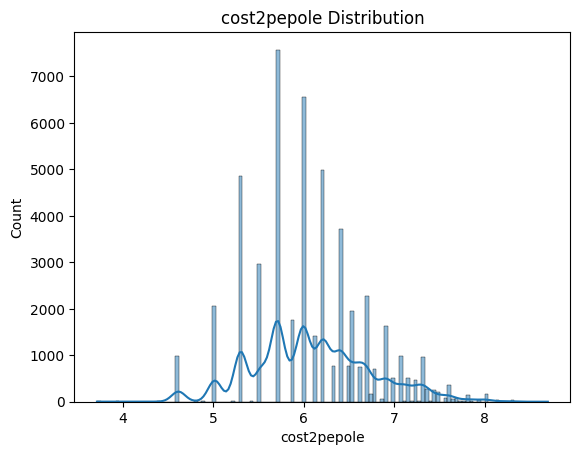

In [69]:
sns.histplot(np.log1p(df['cost2pepole']),kde=True)
plt.title("cost2pepole Distribution")
plt.show()

In [70]:
fig=px.box(
    df,
    y='cost2pepole',
    title='cost2pepole Distribution')
fig.show()

#### 3.10.3 Cost Buckets

In [71]:
df['cost_bucket'] = pd.qcut(
    df['cost2pepole'],
    q=[0, 0.25, 0.5, 0.75, 1.0],
    labels=['Low', 'Medium', 'High', 'Premium']
)


In [72]:
df['cost_bucket'].value_counts()


cost_bucket
Low        18554
Premium    12836
High       11650
Medium      8331
Name: count, dtype: int64

#### 3.10.4 What is the distribution of restaurants across cost buckets?

In [73]:
import plotly.express as px

bucket_counts = df['cost_bucket'].value_counts().reset_index()
bucket_counts.columns = ['cost_bucket', 'count']

fig_Cost_Buckets = px.bar(
    bucket_counts,
    x='cost_bucket',
    y='count',
    title='Distribution of Restaurants by Cost Bucket',
    labels={
        'cost_bucket': 'Cost Category',
        'count': 'Number of Restaurants'
    }
)

fig_Cost_Buckets.show()


### 3.11 Votes Column Processing

### **Analysis Question:** How is customer engagement distributed across restaurants?


In [74]:
df['votes'].unique()

array([ 775,  787,  918, ..., 4957, 2382,  843])

In [75]:
df['votes'].value_counts()

votes
0       10027
4        1140
6         992
7         872
9         738
        ...  
8419        1
4614        1
2872        1
2749        1
3730        1
Name: count, Length: 2328, dtype: int64

In [76]:
df['votes'].describe()

count    51717.000000
mean       283.697527
std        803.838853
min          0.000000
25%          7.000000
50%         41.000000
75%        198.000000
max      16832.000000
Name: votes, dtype: float64

#### 3.11.2 Votes Distribution (Log-transformed)

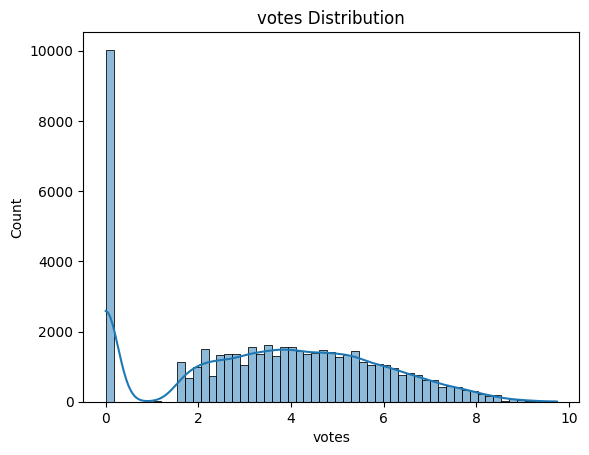

In [77]:
sns.histplot(np.log1p(df['votes']),kde=True)
plt.title("votes Distribution")
plt.show()

## 4. Univariate Analysis

### 4.1 Rating Distribution Analysis

In [78]:
fig=px.box(
    df,
    y='rate',
    title='Rating Distribution')
fig.show()

### 4.2 Votes Distribution Analysis

In [79]:
fig=px.box(
    df, 
    y='votes',
    title='Votes Distribution')
fig.show()

## 5. Bivariate & Multivariate Analysis

### 5.1 Rating vs Votes Relationship

#### **Analysis Question:** Is there a correlation between the number of votes and restaurant ratings?

In [80]:
fig_correlation_votes_rating=px.scatter(
    df,
    x='votes',
    y='rate',
    log_x=True,
    title='Rating vs Votes'
)
fig_correlation_votes_rating.show()

In [81]:
px.scatter(
    df,
    x='votes',
    y='rate',
    log_x=True,
    trendline='ols',
    title='Rating vs Votes'
)


#### 5.1.1 Rating Comparison by Vote Segments

In [82]:
df[df['votes'] < 20]['rate'].describe()

count    9844.000000
mean        3.364831
std         0.214804
min         2.600000
25%         3.200000
50%         3.400000
75%         3.500000
max         4.300000
Name: rate, dtype: float64

In [83]:
df[df['votes'] > 200]['rate'].describe()

count    12825.000000
mean         4.040554
std          0.397587
min          1.800000
25%          3.900000
50%          4.100000
75%          4.300000
max          4.900000
Name: rate, dtype: float64

### 5.2 Understanding Missing Ratings

### **Analysis Question:** Are ratings missing at random, or is there a pattern?

#### 5.2.1 Votes vs Missing Ratings

In [84]:
df['rate']=pd.to_numeric(df['rate'], errors='coerce')

In [85]:
df.groupby('rate_missing')['votes'].describe()

,count,mean,std,min,25%,50%,75%,max
rate_missing,,,,,,,,
False,41665.0,351.653018,881.800960,0.0,21.0,73.0,276.0,16832.0
True,10052.0,2.025667,54.568223,0.0,0.0,0.0,0.0,2508.0


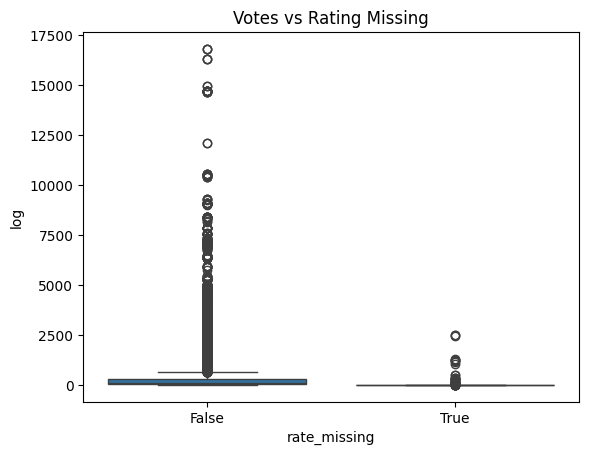

In [86]:
sns.boxplot(data=df,x='rate_missing',y='votes')
plt.ylabel('log')
plt.title('Votes vs Rating Missing')
plt.show()

#### 5.2.2 Cost vs Missing Ratings

#### **Analysis Question:** Do more expensive restaurants have more/fewer missing ratings?

In [87]:
df.groupby('rate_missing')['cost2pepole'].describe()

,count,mean,std,min,25%,50%,75%,max
rate_missing,,,,,,,,
False,41418.0,603.268048,464.327857,40.0,300.0,500.0,700.0,6000.0
True,9953.0,356.366824,218.387792,50.0,200.0,300.0,400.0,2100.0


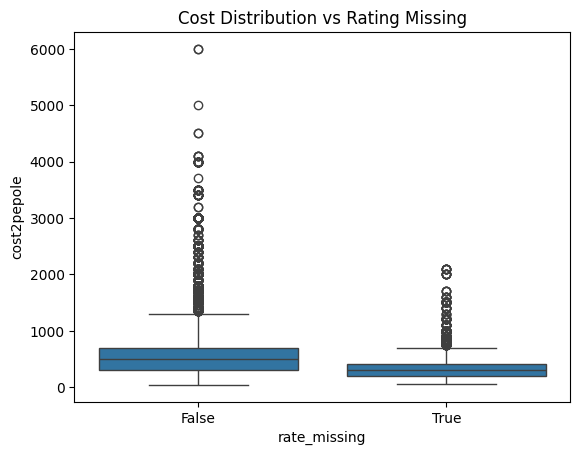

In [88]:
sns.boxplot(data=df,x='rate_missing',y='cost2pepole')
plt.title('Cost Distribution vs Rating Missing')
plt.show()

#### 5.2.3 Online Ordering vs Missing Ratings

#### **Analysis Question:** Does online ordering availability correlate with rating availability?

In [89]:
ct_online=pd.crosstab(df['rate_missing'], df['online_order'], normalize='index')

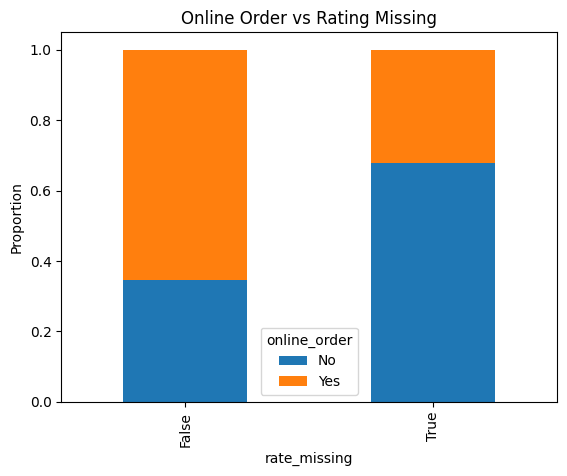

In [90]:
ct_online.plot(kind='bar',stacked=True)
plt.title('Online Order vs Rating Missing')
plt.ylabel('Proportion')
plt.show()

In [91]:
fig = px.bar(
    ct_online,
    x=ct_online.index,
    y=ct_online.columns,
    title='Online Order vs Rating Missing',
    labels={
        'value': 'Proportion',
        'rate_missing': 'Rating Missing'
    }
)

fig.update_layout(
    barmode='stack',
    yaxis=dict(range=[0, 1])
)

fig.show()


#### 5.2.4 Table Booking vs Missing Ratings

#### **Analysis Question:** Is there a relationship between table booking capability and rating availability?


In [92]:
ct_book=pd.crosstab(df['rate_missing'], df['book_table'], normalize='index')

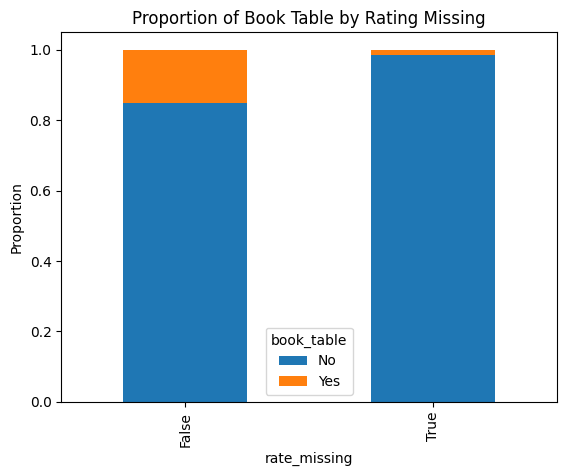

In [93]:
ct_book.plot(kind='bar',stacked=True)
plt.title('Proportion of Book Table by Rating Missing')
plt.ylabel('Proportion')
plt.show()

___________________________________

### 5.3 Chain Restaurant Analysis

### **Analysis Question:** How do chain restaurants compare to single outlets in terms of presence and performance?

#### 5.3.1 Chain vs Single Outlet Distribution

In [94]:
count_df = df['is_chain'].value_counts().reset_index()
count_df.columns = ['is_chain', 'count']

count_df['is_chain'] = count_df['is_chain'].map({0: 'Single Outlet', 1: 'Chain'})

fig_chain_single = px.bar(
    count_df,
    x='is_chain',
    y='count',
    text='count',              
    color='is_chain',          
    color_discrete_sequence=px.colors.qualitative.Set2
)


fig_chain_single.update_layout(
    xaxis_title='', 
    yaxis_title='Number of Restaurants',
    title='Single vs Chain Restaurants',
    showlegend=False
)

fig_chain_single.show()



#### 5.3.2 Chain Size Distribution

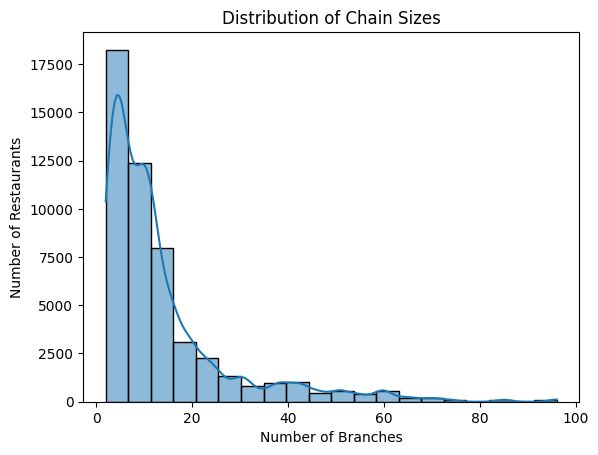

In [95]:
sns.histplot(df[df['chain_size']>1]['chain_size'], bins=20, kde=True)
plt.xlabel('Number of Branches')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Chain Sizes')
plt.show()


#### 5.3.3 Rating Performance: Chain vs Single Outlet

#### **Analysis Question:** Do chain restaurants have different ratings compared to single outlets?


In [96]:
df['chain_label'] = df['is_chain'].map({0: 'Single Outlet', 1: 'Chain'})

fig_chain_single_rate = px.box(
    df,
    x='chain_label',
    y='rate',
    color='chain_label',
    # color_discrete_sequence=px.colors.qualitative.Set2,
    # points='all'  
)


fig_chain_single_rate.update_layout(
    xaxis_title='',
    yaxis_title='Rating',
    title='Rating Distribution: Chain vs Single Outlet',
    showlegend=False
)

fig_chain_single_rate.show()


#### 5.3.4 Customer Engagement: Chain vs Single Outlet

#### **Analysis Question:** Do chain restaurants receive more votes than single outlets?


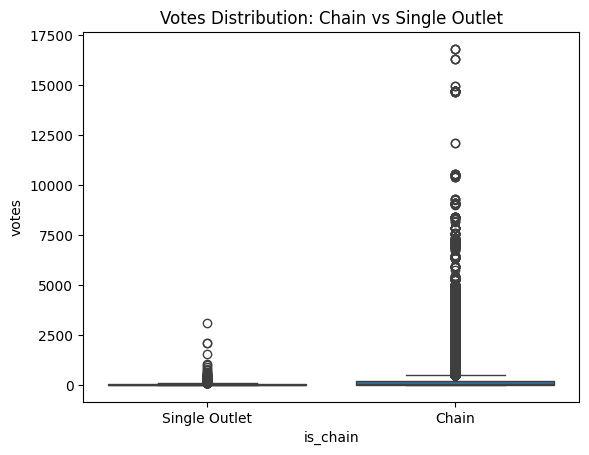

In [97]:
sns.boxplot(x='is_chain', y='votes', data=df)
plt.xticks([0,1], ['Single Outlet', 'Chain'])
plt.title('Votes Distribution: Chain vs Single Outlet')
# plt.ylabel('log')
plt.show()


#### 5.3.5 Chain Size vs Rating Correlation

In [98]:
fig_chain_rate_corr=px.scatter(
    df,
    x='chain_size',
    y='rate',
    log_x=True,
    title='Chain Size vs Rating'
)
fig_chain_rate_corr.show()

___________________________________

### 5.4 Restaurant Type Analysis

### **Analysis Question:** Which restaurant types are most common in Bangalore?


#### 5.4.1 Top 10 Most Frequent Restaurant Types

In [99]:
top_10 = rest_type_frequency.head(10)
top_10

rest_type
quick bites           19132
casual dining         10330
cafe                   3732
delivery               2604
dessert parlor         2263
delivery, takeaway     2037
bar, casual dining     1579
bakery                 1141
beverage shop           867
bar                     697
Name: count, dtype: int64

In [100]:
top_10_types=top_10.index
df_top=df[df['rest_type'].isin(top_10_types)]

In [101]:
top_10_df = top_10.reset_index()
top_10_df.columns = ['Restaurant_Type', 'Count']

In [102]:
fig_common_ret_type = px.bar(
    top_10_df,
    x='Count',
    y='Restaurant_Type',
    text='Count', 
    orientation='h',  
    color='Restaurant_Type',
    color_discrete_sequence=px.colors.qualitative.Set2
)


fig_common_ret_type.update_layout(
    xaxis_title='Number of Restaurants',
    yaxis_title='Restaurant Type',
    title='Top 10 Most Frequent Restaurant Types',
    showlegend=False
)

fig_common_ret_type.show()


#### 5.4.2 Restaurant Type Diversity

#### **Analysis Question:** How many different types does each restaurant typically offer?


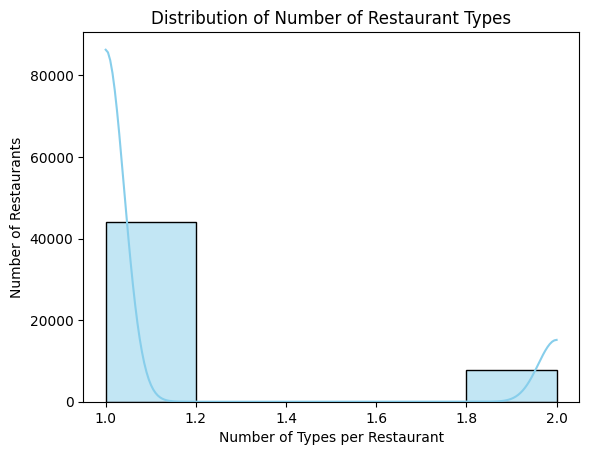

In [103]:
sns.histplot(df['num_of_rest_types'], bins=5, kde=True, color='skyblue')
plt.xlabel('Number of Types per Restaurant')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Number of Restaurant Types')
plt.show()


#### 5.4.3 Rating Distribution by Restaurant Type

#### **Analysis Question:** Do certain restaurant types receive better ratings?


In [104]:
fig_num_rest_type_rate=px.box(
    df_top,
       x='rest_type',
       y='rate',
       title='Distribution of Ratings by Restaurant Type'
)
fig_num_rest_type_rate.show()

#### 5.4.4 Cost Distribution by Restaurant Type

#### **Analysis Question:** How does pricing vary across different restaurant types?


In [105]:
fig_num_rest_type_cost=px.box(
    df_top,
    x='rest_type',
    y='cost2pepole',
    title='Distribution of cost by Restaurant Type'
)

fig_num_rest_type_cost.show()

### 5.5 Cost & Rating Relationship

### **Analysis Question:** Do more expensive restaurants receive higher ratings?


In [106]:
fig_rate_cost=px.scatter(
    df,
    x='cost2pepole',
    y='rate',
    title='cost vs rate',
    trendline='ols'
)
fig_rate_cost.show()

### 5.6 Online Ordering & Table Booking Impact

### **Analysis Question:** How do online ordering and table booking affect restaurant ratings?



#### 5.6.1 Online Ordering Impact (All Restaurants)

In [107]:
fig_online_rate=px.box(
    df,
    x='online_order',
    y='rate',
    title='Impact of Online Ordering on Ratings',
    color='online_order'
)
fig_online_rate.show()

#### 5.6.2 Online Ordering Impact (Rated Restaurants Only)

In [108]:
df_available_rate=df[df['rate'].notna()]

In [109]:
fig=px.box(
    df_available_rate,
    x='online_order',
    y='rate',
    title='Impact of Online Ordering on Ratings',
    color='online_order'
)
fig.show()

#### 5.6.3 Table Booking Impact (All Restaurants)

Text(0.5, 1.0, 'Impact of bokking table on Ratings')

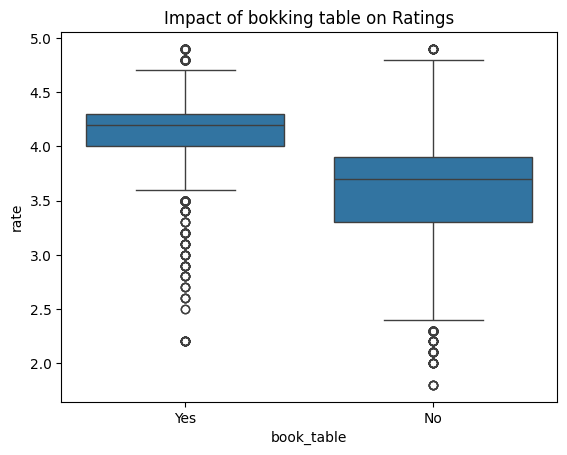

In [110]:
sns.boxplot(
    data=df,
    x='book_table',
    y='rate'
)
plt.title('Impact of bokking table on Ratings')


#### 5.6.4 Table Booking Impact (Rated Restaurants Only)

In [111]:
fig_book_rate=px.box(
    df_available_rate,
    x='book_table',
    y='rate',
    title='Impact of Table Booking on Restaurant Cost',
    color='book_table'
)
fig_book_rate.show()

## 6. Cuisine Analysis

### **Analysis Question:** What are the most popular cuisines and how do they relate to ratings and preferences?


In [112]:
df['cuisines_list']=df['cuisines'].str.split(',\s*')
df_exploded=df.explode('cuisines_list')

In [113]:
top_cuisines=df_exploded['cuisines_list'].value_counts().head(10).reset_index()
top_cuisines.columns=['cuisine', 'count']

### 6.1 Most Popular Cuisines

In [114]:
top_cuisines

,cuisine,count
0,north indian,21085
1,chinese,15547
2,south indian,8644
3,fast food,8096
4,biryani,6492
5,continental,5765
6,desserts,5633
7,cafe,5303
8,beverages,4747
9,italian,3389


In [115]:
fig_top_cui=px.bar(
    top_cuisines,
    x='cuisine',
    y='count',
    title='Top 10 Most Popular Cuisines',
    text='count'
    
)
fig_top_cui.update_traces(textposition='outside')
fig_top_cui.show()

### 6.2 Cuisine Variety vs Ratings

### **Analysis Question:** Does offering more cuisine varieties correlate with higher ratings?


In [116]:
fig_cuivarity_rate=px.box(
    df,
    x='cuisines_count',
    y='rate',
    title='Effect of Cuisine Variety on Ratings'
    
)
fig_cuivarity_rate.show()

### 6.3 Popularity & Customer Engagement

### **Analysis Question:** What is the relationship between restaurant ratings and customer votes?

In [117]:
fig=px.scatter(
    df,
    x='rate',
    y='votes',
    title='Relationship between Rating and Votes',
    trendline='ols',
    log_y=True
)
fig.show()

In [118]:
fig=px.box(
    df,
    x='rate',
    y='votes',
    title='Relationship between Rating and Votes',
    log_y=True
)
fig.show()

#### 6.3.2 Rating Groups Analysis

#### **Feature Engineering:** Creating rating groups for better analysis

In [119]:
bins=[0,1,2,3,4,5]
labels=['0-1', '1-2', '2-3','3-4','4-5']
df['rate_group']=pd.cut(df['rate'], bins=bins, labels=labels, include_lowest=True)

fig_corr_votes_rategroup=px.box(
    df,
    x='rate_group',
    y='votes',
    log_y=True,
    title='Votes Distribution by Rating Group',
    labels={'rate_group':'rating group','votes':'Number of Votes'}
)
fig_corr_votes_rategroup.show()

#### 6.3.3 Restaurant Count by Rating Group

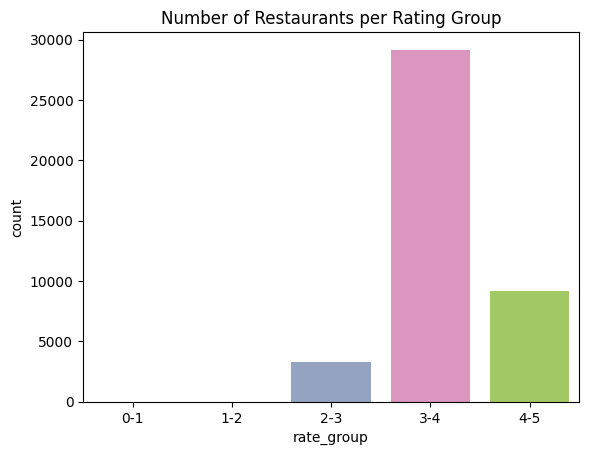

In [120]:
sns.countplot(
    data=df,
    x='rate_group',
     palette='Set2'
)
plt.title('Number of Restaurants per Rating Group')
plt.show()

In [121]:
count_df = df['rate_group'].value_counts().reset_index()
count_df.columns = ['rate_group', 'count']

fig_rest_count_rate = px.bar(
    count_df,
    x='rate_group',
    y='count',
    text='count',  
    color='rate_group',
    color_discrete_sequence=px.colors.qualitative.Set2
)


fig_rest_count_rate.update_layout(
    xaxis_title='Rating Group',
    yaxis_title='Number of Restaurants',
    title='Number of Restaurants per Rating Group',
    showlegend=False
)

fig_rest_count_rate.show()


#### 6.3.4 Average Votes per Rating Group

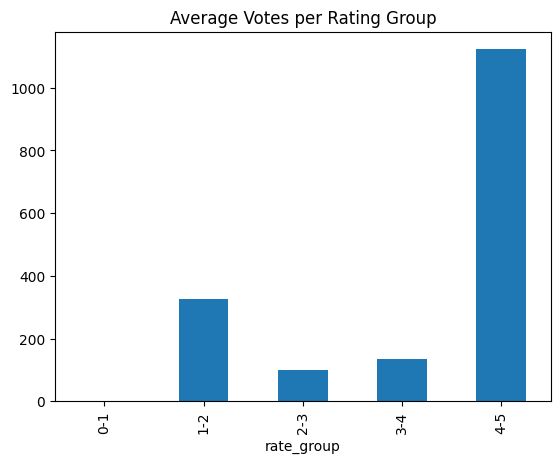

In [122]:
df.groupby('rate_group')['votes'].mean().plot(kind='bar')
plt.title('Average Votes per Rating Group')
plt.show()

## 7. Location-Based Insights

## **Analysis Question:** Which locations have the most restaurants and what are their characteristics?

In [123]:
top_location=df['location'].value_counts().head(10).reset_index()
top_location.columns= ['location', 'count']

### 7.1 Top 10 Most Popular Locations by Restaurant Count

In [124]:
top_location

,location,count
0,btm,5124
1,hsr,2523
2,koramangala 5th block,2504
3,jp nagar,2235
4,whitefield,2144
5,indiranagar,2083
6,jayanagar,1926
7,marathahalli,1846
8,bannerghatta road,1630
9,bellandur,1286


In [125]:
fig_location=px.bar(
    top_location,
    x='location',
    y='count',
    title='Top 10 Most Popular location',
    text='count'
)
fig_location.update_traces(textposition='outside')
fig_location.show()

### 7.2 Top 10 Locations by Average Rating

### **Analysis Question:** Which locations have the highest-rated restaurants?

In [126]:
top_location=df.groupby('location')['rate'].mean().sort_values(ascending=False).head(10).reset_index()
top_location['rate']=top_location['rate'].round(2)

fig_location_rate = px.bar(
    top_location,
    x='location',
    y='rate',          
    title='Top 10 Locations with Highest Average Rating',
    text='rate'
)

fig_location_rate.update_traces(textposition='outside')
fig_location_rate.show()

### 7.3 Cost Distribution by Top Locations

### **Analysis Question:** How does pricing vary across the most popular locations?

In [127]:
top_location_cost=df['location'].value_counts().head(10).index
df_loc_top=df[df['location'].isin(top_location_cost)]

fig_location_cost = px.box(
    df_loc_top,
    x='location',
    y='cost2pepole',
    title='Cost Distribution by Top 10 Locations',
    labels={'location': 'Location', 'cost2people': 'Cost for Two'}
)

fig_location_cost.show()

### 7.4 Location Analysis: Rating vs Cost vs Volume

### **Analysis Question:** How do average rating, average cost, and number of restaurants relate across locations?


In [128]:
cost_rating_location = df.groupby('location').agg(
    Avg_Rating=('rate','mean'),
    Avg_Cost=('cost2pepole','mean')
).reset_index()

cost_rating_location['Num_Restaurants'] = df.groupby('location')['rate'].count().values


fig_location_cost_rate = px.scatter(
    cost_rating_location,
    x='Avg_Cost',
    y='Avg_Rating',
    size='Num_Restaurants',       
    color='Avg_Rating',             
    hover_name='location',        
    title='Average Rating vs Average Cost per Location',
    color_continuous_scale='Viridis',
    size_max=40
)


fig_location_cost_rate.update_layout(
    xaxis_title='Average Cost per Person',
    yaxis_title='Average Rating',
    legend_title='Average Rating',
)

fig_location_cost_rate.show()


## 8. Dish Preferences Analysis (just on 50% of Data)

## **Analysis Question:** What are customers' favorite dishes and how do they vary by location and characteristics?


### 8.1 Dish Data Exploration

In [129]:
df['dish_liked'].isnull().mean() *100

np.float64(54.29162557766305)

In [130]:
df['dish_liked'].unique()

array(['Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
       'Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani',
       'Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza',
       ...,
       'Noodles, Chicken Noodle, Momos, American Chopsuey, Salad, Manchow Soup, Manchurian',
       'Chicken Quesadilla, Naan, Breakfast Buffet, Cheesecake, Cocktails, Lunch Buffet, Biryani',
       'Biryani, Andhra Meal'], dtype=object)

In [131]:
df['dish_liked'].value_counts()

dish_liked
Biryani                                                                                     182
Chicken Biryani                                                                              73
Friendly Staff                                                                               69
Waffles                                                                                      68
Paratha                                                                                      57
                                                                                           ... 
Masala Dosa, Filter Coffee, Curd Rice                                                         1
Dal Makhani, Galauti Kebab, Dum Biryani, Rasgulla, Fish, Garlic Kheer, Tandoori Broccoli      1
Pasta, Coffee, Mocktails, Pizza, Sandwiches, Macaroon, Croissants                             1
Rolls, Butter Chicken, Tandoori Momos, Tangdi Kabab, Tandoori Roti, Paratha, Soya Chaap       1
Chocolate Momos, Burgers, Noo

### 8.2 Dish Data Cleaning

In [132]:
df_dishes_clean=df[df['dish_liked'].notnull()].copy()

In [133]:
def sort_dish(value):
    types = [t.strip() for t in str(value).split(',')]
    types.sort()
    return ', '.join(types)

df_dishes_clean['dish_liked'] = df_dishes_clean['dish_liked'].apply(sort_dish)

In [134]:
df_dishes_clean['dish_liked'].value_counts()

dish_liked
Biryani                                                                                             182
Chicken Biryani                                                                                      73
Friendly Staff                                                                                       69
Waffles                                                                                              68
Paratha                                                                                              57
                                                                                                   ... 
Cocktails, Lamb Pizza, Panna Cotta, Pita Bread                                                        1
Chicken Sizzler, Dessert Platter, Lobster, Mocktails, Murgh Platter, Tiramisu, Vegetable Biryani      1
Coffee, Fish, Mango Ice Cream, Mutton Curry, Paan Kulfi, Paneer Tikka, Pasta                          1
Dal Makhani, Dum Biryani, Fish, Galauti Kebab, Garlic

### 8.3 Dish List Processing for Analysis

In [135]:
df_dishes_clean['dish_list']=df_dishes_clean['dish_liked'].str.split(',\s*')
df_dishes_explode=df_dishes_clean.explode('dish_list')

In [136]:
df_dishes_clean['dish_list'].head()

0    [Dum Biryani, Lunch Buffet, Masala Papad, Pane...
1    [Chicken Biryani, Chocolate Nirvana, Dum Birya...
2    [Cannelloni, Churros, Hot Chocolate, Minestron...
3                                        [Masala Dosa]
4                                [Gol Gappe, Panipuri]
Name: dish_list, dtype: object

In [137]:
df_dishes_explode['dish_list']

0           Dum Biryani
0          Lunch Buffet
0          Masala Papad
0        Paneer Lajawab
0                 Pasta
              ...      
51711       Andhra Meal
51711           Biryani
51715        Buttermilk
51715         Cocktails
51715             Pizza
Name: dish_list, Length: 128848, dtype: object

In [138]:
df_dishes_explode.head()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,cost2pepole,...,rate_missing_label,is_chain,chain_size,num_of_rest_types,cuisines_count,cost_bucket,chain_label,cuisines_list,rate_group,dish_list
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Dum Biryani, Lunch Buffet, Masala Papad, Panee...","chinese, mughlai, north indian",800.0,...,Available,1,11,1,3,Premium,Chain,"[chinese, mughlai, north indian]",4-5,Dum Biryani
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Dum Biryani, Lunch Buffet, Masala Papad, Panee...","chinese, mughlai, north indian",800.0,...,Available,1,11,1,3,Premium,Chain,"[chinese, mughlai, north indian]",4-5,Lunch Buffet
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Dum Biryani, Lunch Buffet, Masala Papad, Panee...","chinese, mughlai, north indian",800.0,...,Available,1,11,1,3,Premium,Chain,"[chinese, mughlai, north indian]",4-5,Masala Papad
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Dum Biryani, Lunch Buffet, Masala Papad, Panee...","chinese, mughlai, north indian",800.0,...,Available,1,11,1,3,Premium,Chain,"[chinese, mughlai, north indian]",4-5,Paneer Lajawab
0,jalsa,Yes,Yes,4.1,775,banashankari,casual dining,"Dum Biryani, Lunch Buffet, Masala Papad, Panee...","chinese, mughlai, north indian",800.0,...,Available,1,11,1,3,Premium,Chain,"[chinese, mughlai, north indian]",4-5,Pasta


### 8.4 Top 20 Most Liked Dishes

### **Analysis Question:** What are the most popular dishes across all restaurants?
"""

In [139]:
top_dishes=df_dishes_explode['dish_list'].value_counts().head(20).reset_index()
top_dishes.columns=['dish', 'count']

In [140]:
fig_top_dish=px.bar(
    top_dishes,
    x='dish',
    y='count',
    title='Top 20 Most Liked Dishes',
    text='count'
)
fig_top_dish.update_traces(textposition='outside')
fig_top_dish.show()

### 8.5 Top Dishes by Location

### **Analysis Question:** What are the top 3 dishes in each location?


In [141]:
top_dishes_per_loc= (
    df_dishes_explode.groupby('location')['dish_list']
    .value_counts()
    .groupby(level=0)
    .head(3)
    .reset_index(name='count')
)

category_order=top_dishes_per_loc.sort_values('count', ascending=False)['dish_list']

fig_dish_location=px.bar(
    top_dishes_per_loc,
    y='count',
    x='dish_list',
    color='location',
    title='Top 3 Dishes per Location',
    # orientation='h',
    category_orders={'dish_list': category_order}
)


fig_dish_location.update_layout(
    # xaxis={'categoryorder':'total ascending'},  
    yaxis_title='Number of Orders',
    xaxis_title='Dish',
    legend_title='Location',
    xaxis_tickangle=-45
)

fig_dish_location.show()
    

### 8.6 Top Dishes by Average Rating

### **Analysis Question:** Which dishes are associated with the highest-rated restaurants?


In [142]:
top_dishes_rate=(
    df_dishes_explode.groupby('dish_list')['rate']
    .mean()
    .sort_values(ascending=False)
    .head(10)
    .reset_index()
    .rename(columns={'rate':'avg_rating'})
)
fig_dish_rate=px.bar(
    top_dishes_rate,
    x='dish_list',
    y='avg_rating',
    text='avg_rating',
    title='Top 10 Dishes by Average Rating'
)
fig_dish_rate.update_traces(textposition='outside')
fig_dish_rate.show()

### 8.7 Top Dishes by Average Cost

### **Analysis Question:** Which dishes are found at the most expensive restaurants?


In [143]:
top_dish_cost=(
    df_dishes_explode.groupby('dish_list')['cost2pepole']
    .mean()
    .sort_values(ascending=False)
    .head(10)
    .reset_index()
    .rename(columns={'cost2pepole':'Avg_Cost'})
)
fig_dish_cost=px.bar(
    top_dish_cost,
    x='dish_list',
    y='Avg_Cost',
   text='Avg_Cost',
   title='Top 10 Dishes by Average Cost for Two'    
)

fig_dish_cost.update_traces(textposition='outside')
fig_dish_cost.show()

### 8.8 Number of Liked Dishes Distribution

### **Analysis Question:** How many dishes do customers typically mention as liked?


In [144]:
df_dishes_clean['num_dishes']=df_dishes_clean['dish_list'].apply(len)

fig_num_dish=px.histogram(
    df_dishes_clean,
    x='num_dishes',
    nbins=20,
    title='Distribution of Number of Dishes per Customer'
    
)
fig_num_dish.show()

## 9. Data Export

In [145]:
df.to_csv('df_eda.csv', index=False)

### 9.2 Save Visualization Object

In [146]:
import pickle

figures = {
    "fig_correlation_votes_rating": fig_correlation_votes_rating,
    "fig_chain_single": fig_chain_single,
    "fig_chain_single_rate": fig_chain_single_rate,
    "fig_chain_rate_corr": fig_chain_rate_corr,
    "fig_common_ret_type": fig_common_ret_type,
    "fig_num_rest_type_rate": fig_num_rest_type_rate,
    "fig_num_rest_type_cost": fig_num_rest_type_cost,
    "fig_Cost_Buckets": fig_Cost_Buckets,
    "fig_rate_cost": fig_rate_cost,
    "fig_online_rate": fig_online_rate,
    "fig_book_rate": fig_book_rate,
    "fig_top_cui": fig_top_cui,
    "fig_cuivarity_rate": fig_cuivarity_rate,
    "fig_corr_votes_rategroup": fig_corr_votes_rategroup,
    "fig_rest_count_rate": fig_rest_count_rate,
    "fig_location": fig_location,
    "fig_location_rate": fig_location_rate,
    "fig_location_cost": fig_location_cost,
    "fig_location_cost_rate": fig_location_cost_rate,
    "fig_top_dish": fig_top_dish,
    "fig_dish_location": fig_dish_location,
    "fig_dish_rate": fig_dish_rate,
    "fig_dish_cost": fig_dish_cost,
    "fig_num_dish": fig_num_dish
    
}


with open("all_figures.pkl", "wb") as f:
    pickle.dump(figures, f)

print("All figures saved in 'all_figures.pkl'")

All figures saved in 'all_figures.pkl'


## End of Analysis

**Summary:** This exploratory data analysis examined Zomato restaurant data from Bangalore, covering aspects including:
- Restaurant characteristics (type, location, chain status)
- Pricing and rating patterns
- Customer engagement (votes, reviews)
- Service features (online ordering, table booking)
- Cuisine and dish preferences
- Geographic distribution and trends

The cleaned dataset and visualizations have been saved for further analysis or modeling.
